In [2]:
import torch
import os
import numpy as np
import cv2
import scipy

import matplotlib.pyplot as plt

In [3]:
from scipy.ndimage import convolve

In [4]:
%matplotlib inline

In [5]:
pt_list = []

predict_dir = "predict_cache2"
img_dir = 'video_data'
output_dir = 'video_data_output'
for predict_name in os.listdir(predict_dir):
    name,ext = os.path.splitext(predict_name)
    img_name = '{}.{}'.format(name, 'jpg')

    predict_path = os.path.join(predict_dir, predict_name)
    img_path = os.path.join(img_dir, img_name)
    target_path = os.path.join(output_dir, img_name)
    
    det_list = torch.load(predict_path)
    for det in det_list:
        pt_list.append(det['pt'])

In [6]:
pt_arr  =np.array(pt_list)

In [7]:
x = (pt_arr[:,0] + pt_arr[:,2])/2
y = (pt_arr[:,1] + pt_arr[:,3])/2

In [8]:
background_bgr = cv2.imread(img_path)
background = cv2.cvtColor(background_bgr, cv2.COLOR_BGR2RGB)

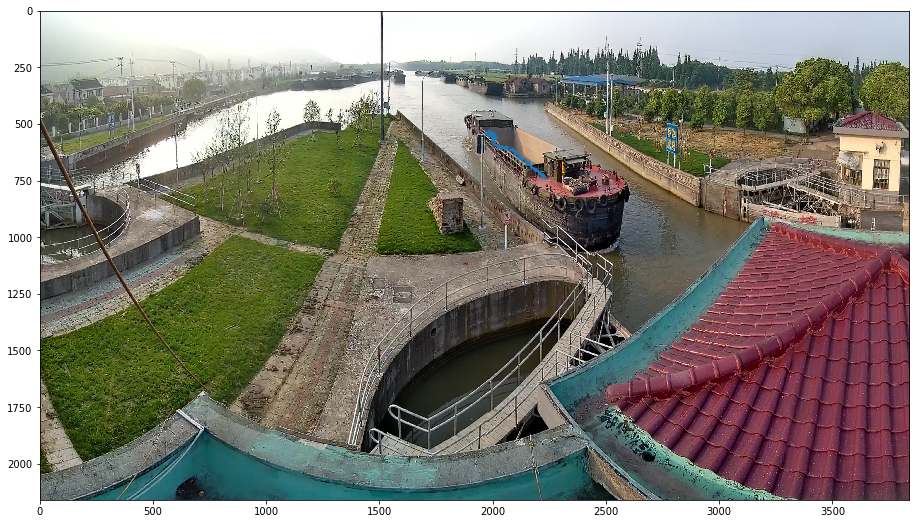

In [9]:
plt.figure(figsize=(16,9))
plt.plot(x,y)
plt.imshow(background)

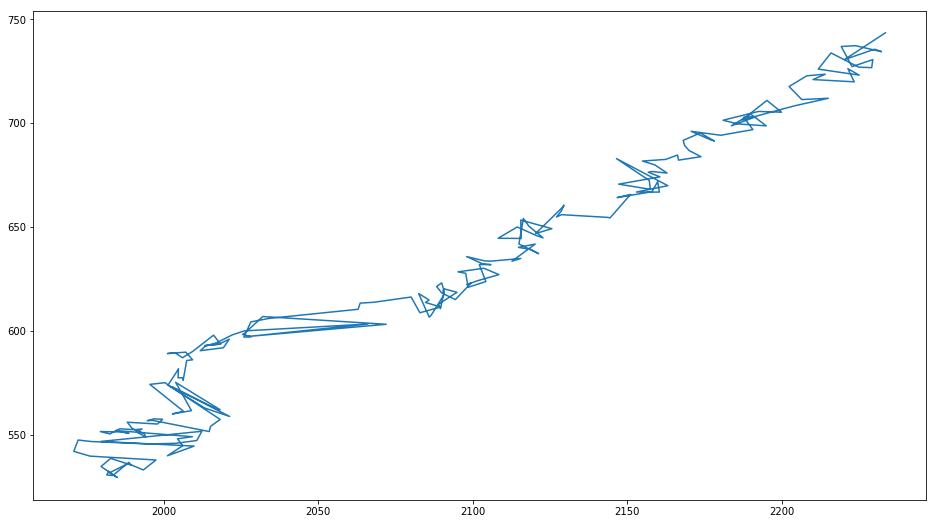

In [10]:
plt.figure(figsize=(16,9))
plt.plot(x,y)


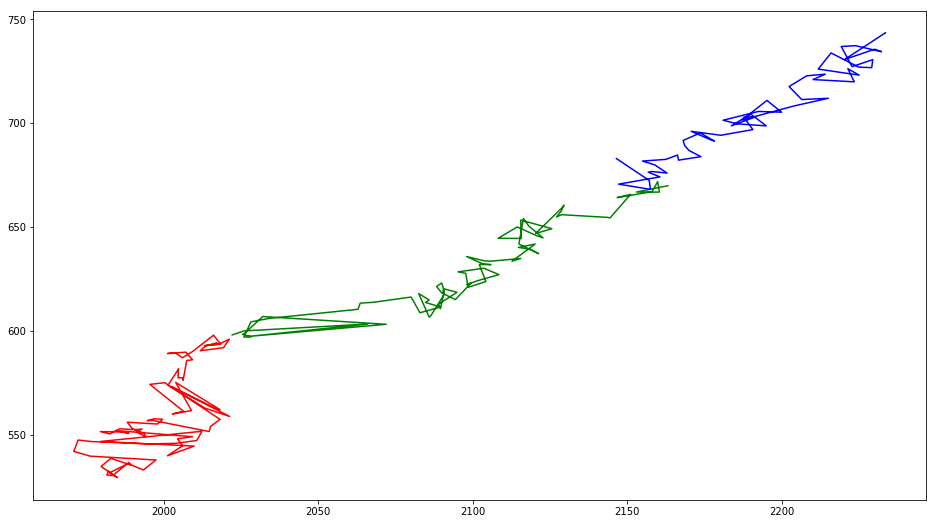

In [11]:
plt.figure(figsize=(16,9))
plt.plot(x[:80],y[:80],color='r')
plt.plot(x[80:160],y[80:160],color='g')
plt.plot(x[160:],y[160:],color='b')
plt.show()

这么个情况先看看简单平滑的结果。

In [30]:
def plot_trace(x,y, alpha=1.0):
    n = x.shape[0]
    plt.plot(x[:n//3],y[:n//3],'-o',color='r', alpha=alpha)
    plt.plot(x[n//3:n//3*2],y[n//3:n//3*2],'-o',color='g', alpha=alpha)
    plt.plot(x[n//3*2:],y[n//3*2:],'-o',color='b', alpha=alpha)


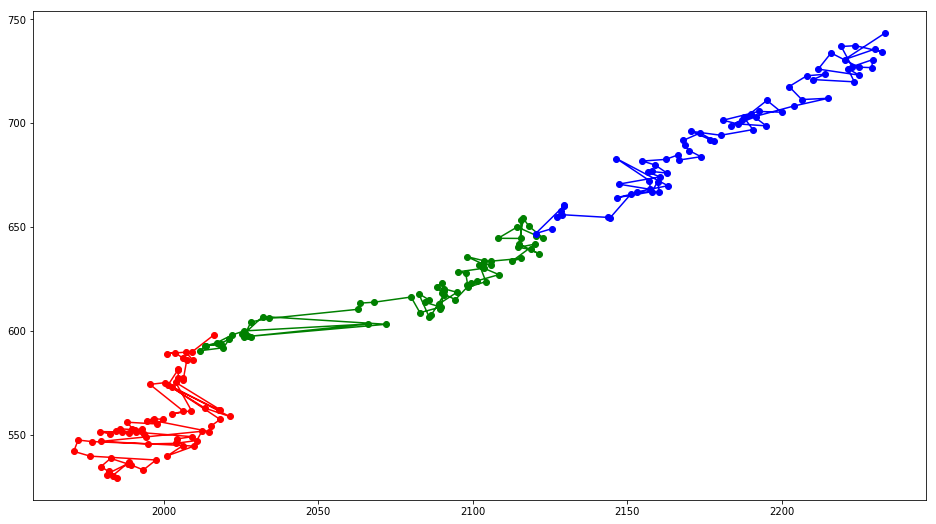

In [13]:
plt.figure(figsize=(16,9))
plot_trace(x,y)
plt.show()

In [14]:
K = np.ones(10)/10
x_bar = convolve(x, K, mode ='nearest')
y_bar = convolve(y, K, mode ='nearest')

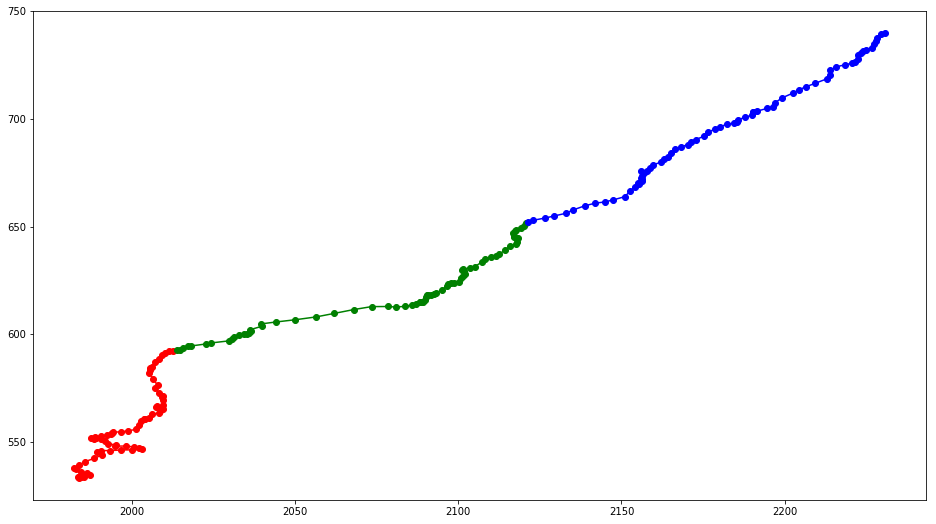

In [15]:
plt.figure(figsize=(16,9))
plot_trace(x_bar, y_bar)
plt.show()

In [16]:
K = np.ones(20)/20
x_bar = convolve(x, K, mode ='nearest')
y_bar = convolve(y, K, mode ='nearest')

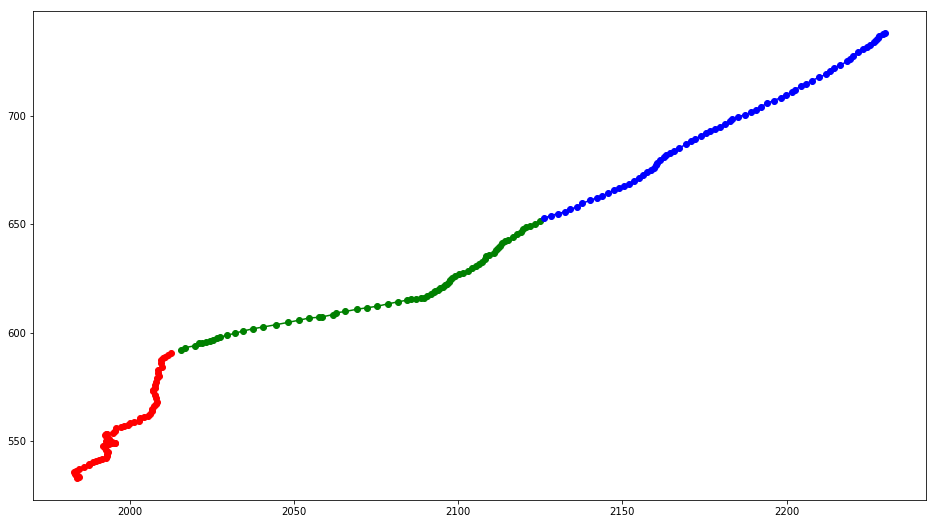

In [17]:
plt.figure(figsize=(16,9))
plot_trace(x_bar, y_bar)
plt.show()

In [18]:
K = np.ones(40)/40
x_bar = convolve(x, K, mode ='nearest')
y_bar = convolve(y, K, mode ='nearest')

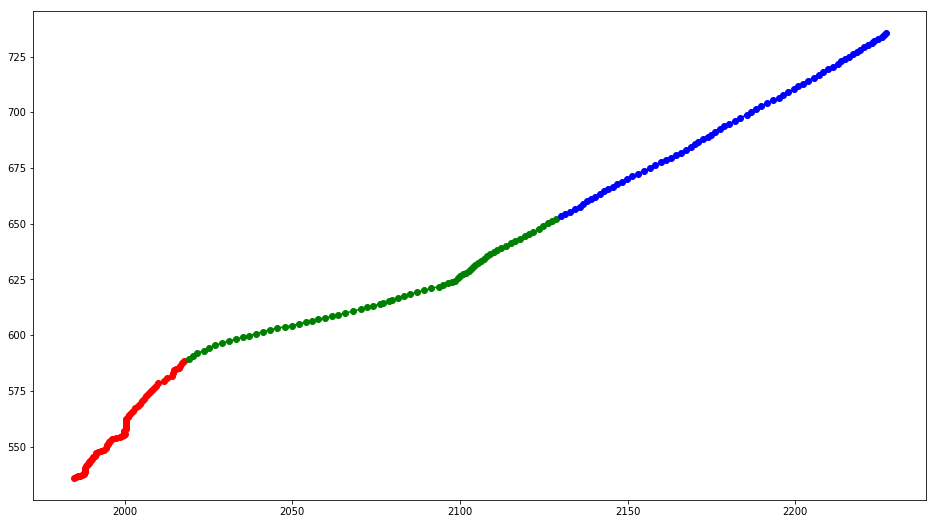

In [19]:
plt.figure(figsize=(16,9))
plot_trace(x_bar, y_bar)
plt.show()

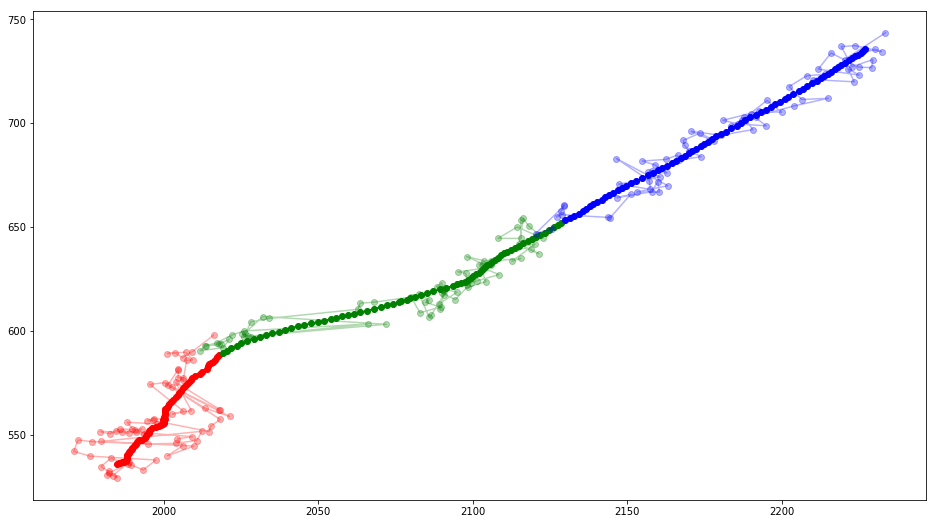

In [32]:
plt.figure(figsize=(16,9))
plot_trace(x_bar, y_bar)
plot_trace(x,y, alpha=0.3)
plt.show()

In [20]:
diff_dis = np.sqrt((x[1:] - x[:-1])**2 + (y[1:]-y[:-1])**2)

(array([21., 37., 44., 26., 33., 14., 12.,  4.,  3.,  3.,  5.,  1.,  2.,
         1.,  2.,  0.,  1.,  1.,  0.,  1.,  0.,  0.,  1.,  2.,  0.,  1.]),
 array([ 0.40744343,  2.1246312 ,  3.841819  ,  5.5590067 ,  7.2761946 ,
         8.993382  , 10.71057   , 12.427757  , 14.144945  , 15.862133  ,
        17.57932   , 19.296509  , 21.013697  , 22.730885  , 24.448072  ,
        26.16526   , 27.882448  , 29.599636  , 31.316824  , 33.03401   ,
        34.751198  , 36.468388  , 38.185574  , 39.902763  , 41.61995   ,
        43.33714   , 45.054325  ], dtype=float32),
 <a list of 26 Patch objects>)

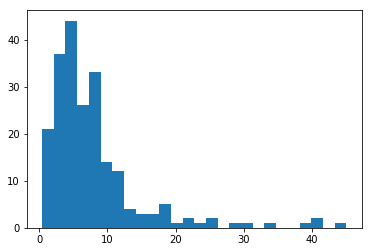

In [23]:
plt.hist(diff_dis,bins='auto')

在这及其有限的样本里差分距离误差都能到40像素以上还行，当然这个图本身也挺大的，从某个轴看也就2%的差别。
我们面临一种两难的问题，需要匹配才能运用光滑，但运用不运用光滑就无法对付这个噪声。所以我们必须从噪声里进行匹配。

In [24]:
diff_dis_bar = np.sqrt((x_bar[1:] - x_bar[:-1])**2 + (y_bar[1:]-y_bar[:-1])**2)

(array([19., 17., 29., 25., 23., 33., 35., 31.,  3.]),
 array([0.44962218, 0.68686616, 0.9241102 , 1.1613542 , 1.3985982 ,
        1.6358422 , 1.8730861 , 2.11033   , 2.3475742 , 2.5848181 ],
       dtype=float32),
 <a list of 9 Patch objects>)

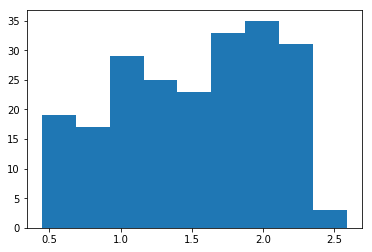

In [27]:
plt.hist(diff_dis_bar,bins='auto')

平滑以后的噪声倒挺小的。匹配过程，生成两帧之间的中心距离矩阵，优先将距离短的匹配上（我们也可以考虑搜索链上的各种分配来改善精度，
不过这个代价可能有点高。）

In [299]:
predict_cache = []
predict_cache_map = {}
for i in range(1,3001):
    det_list = torch.load('predict_cache/images{}.cache'.format(i))
    predict_cache.append(det_list)
    predict_cache_map['images{}.cache'.format(i)] = det_list

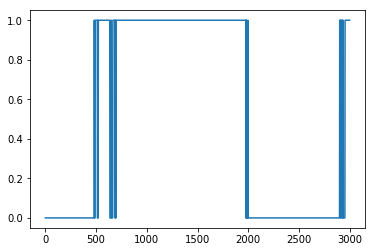

In [300]:
plt.plot([len(pred) for pred in predict_cache])

In [301]:
predict_cache[1500]

[{'score': tensor(0.9840),
  'label_name': 'boat',
  'pt': array([1911.9829 ,  488.12302, 3128.5054 , 1304.4827 ], dtype=float32)}]

In [302]:
np.linalg.norm([1,1])

1.4142135623730951

In [303]:
def box_distance(box1, box2):
    box1_center = np.array([box1['pt'][::2].mean(),box1['pt'][1::2].mean()])
    box2_center = np.array([box2['pt'][::2].mean(),box2['pt'][1::2].mean()])
    #print(box1_center)
    return np.linalg.norm(box1_center - box2_center)

In [304]:
pixel_threshold = 60
#x_bar = convolve(x, K, mode ='nearest')

#num_chain = 0
chain_list = []

for i,pred in enumerate(predict_cache):
    for box in pred:
        if 'matched' in box:
            continue
        box['matched'] = True
        box['head'] = True
        chain = [box]
        num_chain +=1
        
        box_head = box
        for pred_test in predict_cache[i+1:]:
            if len(pred_test) == 0:
                break
            distance_list = []
            for box_test in pred_test:
                if 'matched' not in box_test:
                    distance = box_distance(box_head, box_test)
                    if distance > pixel_threshold:
                        continue
                    distance_list.append(distance)
            if len(distance_list) == 0:
                break
            idx = np.argmin(distance_list)
            pred_test[idx]['matched'] = True
            box_head = pred_test[idx]
            chain.append(box_head)
        
        chain_list.append(chain)
        '''
        pt_conv_list = []
        for pt_idx in range(4):
            pt_conv = convolve([box['pt'][pt_idx] for box in chain], K, mode ='nearest')
            pt_conv_list.append(pt_conv)
        for j,smoothed_pt in enumerate(np.array(pt_conv_list).T):
            chain[j]['pt_smoothed'] = smoothed_pt
            if j>0:
                chain[j-1]['pt_smoothed_next'] = smoothed_pt
                chain[j-1]['pt_next'] = chain[j]['pt']
        chain_list.append(chain)
        '''
                
print('{} chain detected'.format(len(chain_list)))

17 chain detected


In [305]:
# smooth pt
K = np.ones(60)/60
K_delta = np.ones(40)/40

for chain in chain_list:
    pt_conv_list = []
    for pt_idx in range(4):
        pt_conv = convolve([box['pt'][pt_idx] for box in chain], K, mode ='nearest')
        pt_conv_list.append(pt_conv)
    for j,smoothed_pt in enumerate(np.array(pt_conv_list).T):
        chain[j]['pt_smoothed'] = smoothed_pt
        if j>0:
            chain[j-1]['pt_smoothed_next'] = smoothed_pt
            chain[j-1]['pt_next'] = chain[j]['pt']

# TODO: compute normed delta and smooth it            
#for chain

for chain in chain_list:
    for box in chain:
        if 'pt_smoothed_next' in box:
            pt_smoothed_next_center = np.array([box['pt_smoothed_next'][::2].mean(), box['pt_smoothed_next'][1::2].mean()])
            pt_smoothed_cemter = np.array([box['pt_smoothed'][::2].mean(), box['pt_smoothed'][1::2].mean()])                
            box['delta'] = pt_smoothed_next_center - pt_smoothed_cemter

for chain in chain_list:
    delta_conv_list = []
    for delta_idx in range(2):
        delta_conv = convolve([box['delta'][delta_idx] for box in chain if 'delta' in box], K_delta, mode ='nearest')
        delta_conv_list.append(delta_conv)
    for i, delta_smoothed in enumerate(np.array(delta_conv_list).T):
        chain[i]['delta_smoothed'] = delta_smoothed


In [306]:
predict_cache[1500]

[{'score': tensor(0.9840),
  'label_name': 'boat',
  'pt': array([1911.9829 ,  488.12302, 3128.5054 , 1304.4827 ], dtype=float32),
  'matched': True,
  'pt_smoothed': array([1915.2932,  488.3502, 3127.2136, 1295.9731], dtype=float32),
  'pt_smoothed_next': array([1916.1132 ,  488.90652, 3129.5664 , 1296.1301 ], dtype=float32),
  'pt_next': array([1918.058 ,  497.5606, 3127.3801, 1289.0756], dtype=float32),
  'delta': array([1.5864258 , 0.35662842], dtype=float32),
  'delta_smoothed': array([1.2534119 , 0.40222472], dtype=float32)}]

In [283]:
delta_conv_list

[array([-0.00674438, -0.00653381, -0.00632629, -0.00611572, -0.0059082 ,
        -0.00569763, -0.00549011, -0.00527954, -0.00507202, -0.00486145,
        -0.00466003, -0.0050293 , -0.00467224, -0.00429382, -0.00418396,
        -0.00435791, -0.0039978 , -0.00383911, -0.00379639, -0.00331421,
        -0.00253601, -0.00185547, -0.00117493, -0.00060425,  0.00050354,
         0.00075684,  0.00144043,  0.00258789,  0.00307617,  0.00344238,
         0.00365601,  0.00381775,  0.00342407,  0.00380554,  0.0038269 ,
         0.00385132,  0.00387268,  0.00389709,  0.00391846,  0.00393982,
         0.00396423,  0.0039856 ,  0.00401001,  0.00403137,  0.00405579,
         0.00407715], dtype=float32),
 array([0.01079102, 0.01091156, 0.01103134, 0.01115189, 0.01127167,
        0.01139221, 0.01151199, 0.01163254, 0.01175308, 0.01187286,
        0.01203079, 0.0122345 , 0.01298599, 0.01383209, 0.01463928,
        0.01566849, 0.01683121, 0.01790543, 0.01918182, 0.02027588,
        0.02121124, 0.0216774 , 0

(array([185., 202., 190., 132., 190., 112.,  56.,  90., 133.,  78.,  31.,
         27.,  26.,  29.,  18.,   6.]),
 array([0.04086304, 0.6098652 , 1.1788673 , 1.7478695 , 2.3168716 ,
        2.8858738 , 3.454876  , 4.023878  , 4.5928802 , 5.1618824 ,
        5.7308846 , 6.2998867 , 6.868889  , 7.437891  , 8.006893  ,
        8.575895  , 9.144897  ], dtype=float32),
 <a list of 16 Patch objects>)

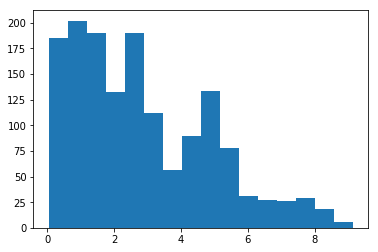

In [256]:
plt.hist([np.abs(box['delta']).sum()  for pred in predict_cache for box in pred  if 'delta' in box], bins='auto')

In [258]:
sorted([np.abs(box['delta']).sum()  for pred in predict_cache for box in pred  if 'delta' in box])[:20]

[0.040863037,
 0.04864502,
 0.058776855,
 0.058776855,
 0.058776855,
 0.058898926,
 0.058898926,
 0.058929443,
 0.0630188,
 0.068573,
 0.070373535,
 0.07507324,
 0.07546997,
 0.07546997,
 0.07546997,
 0.07550049,
 0.07559204,
 0.07559204,
 0.07559204,
 0.07559204]

suppressed
23


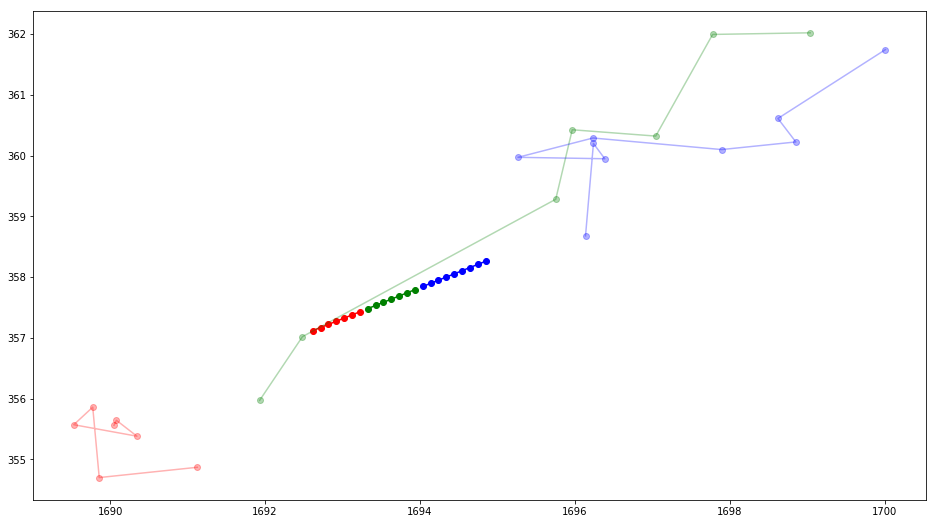

2


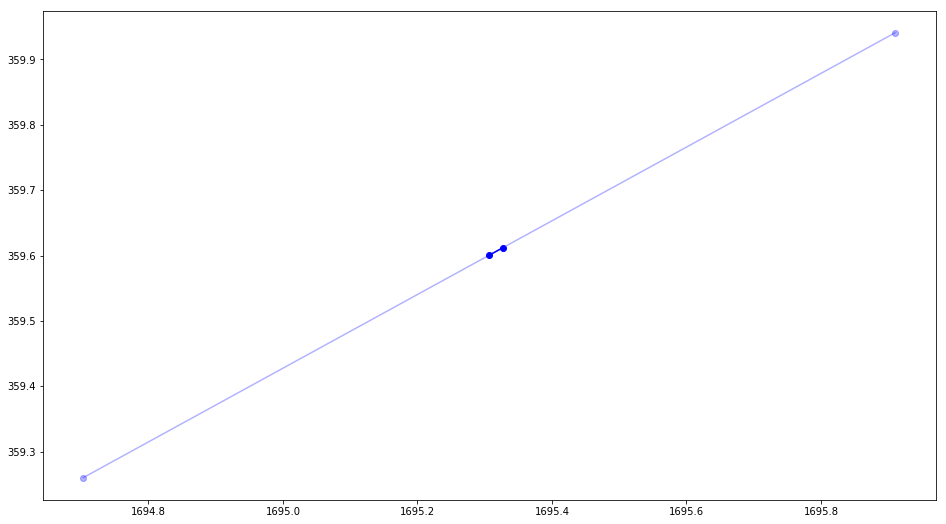

114


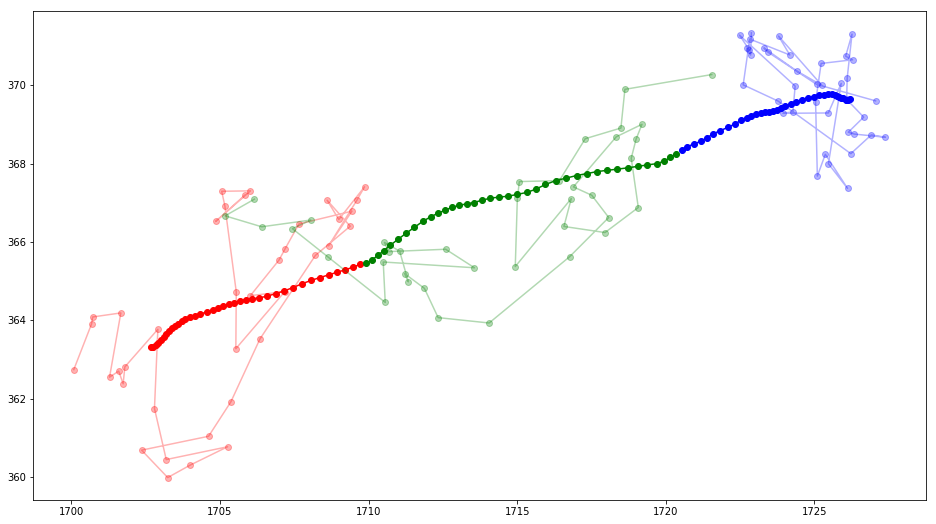

4


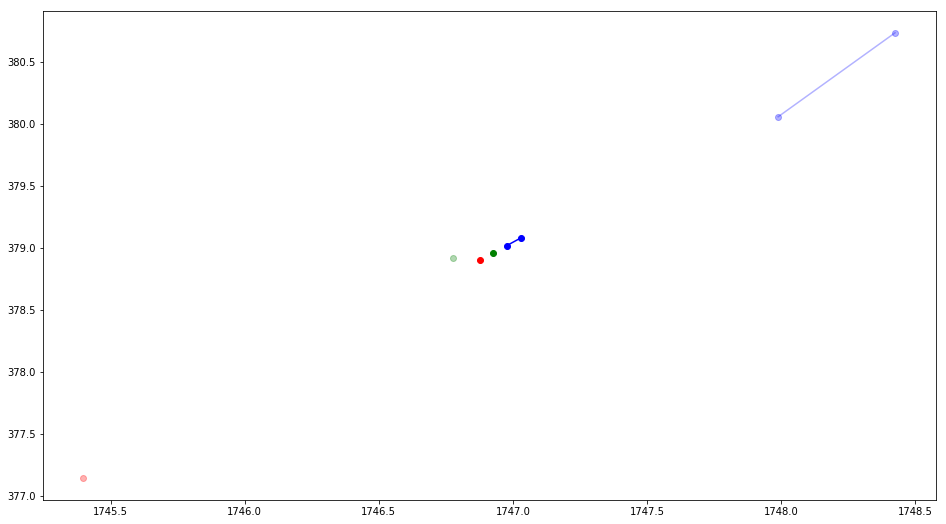

20


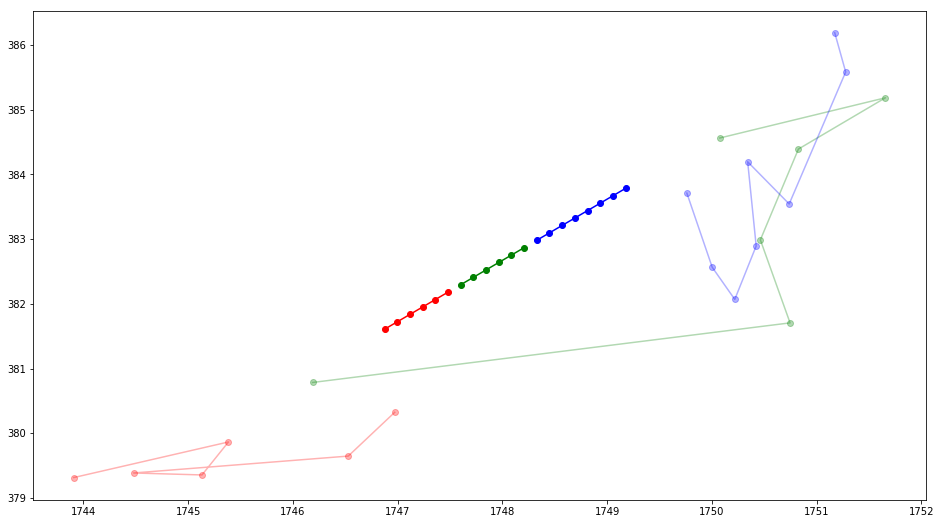

5


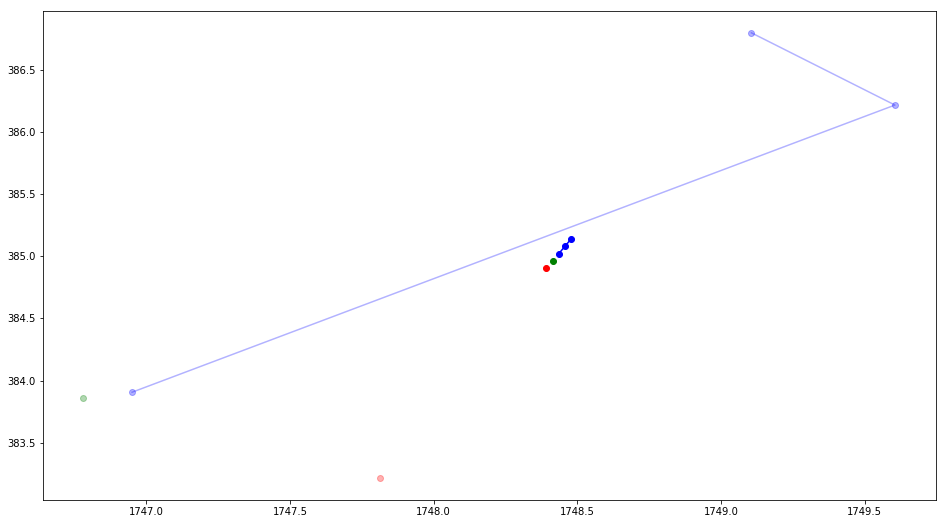

1247


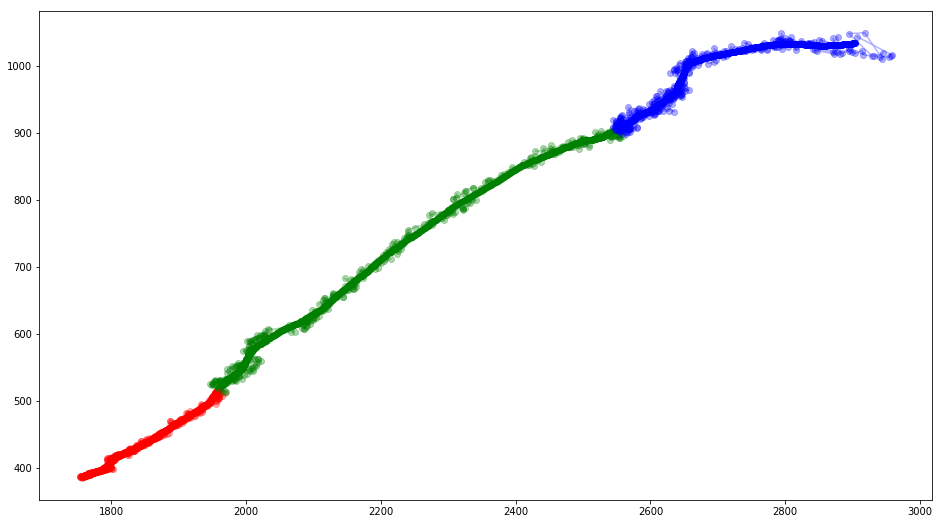

33


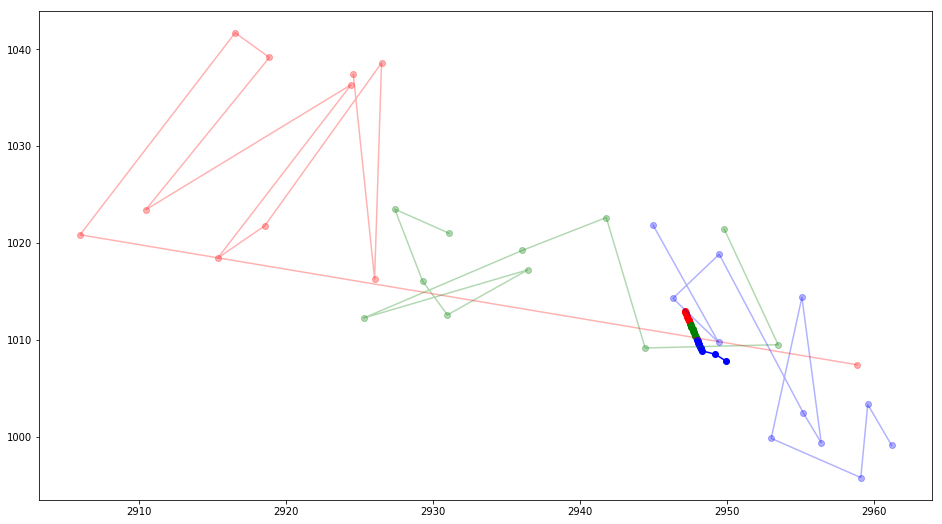

suppressed
suppressed
suppressed
7


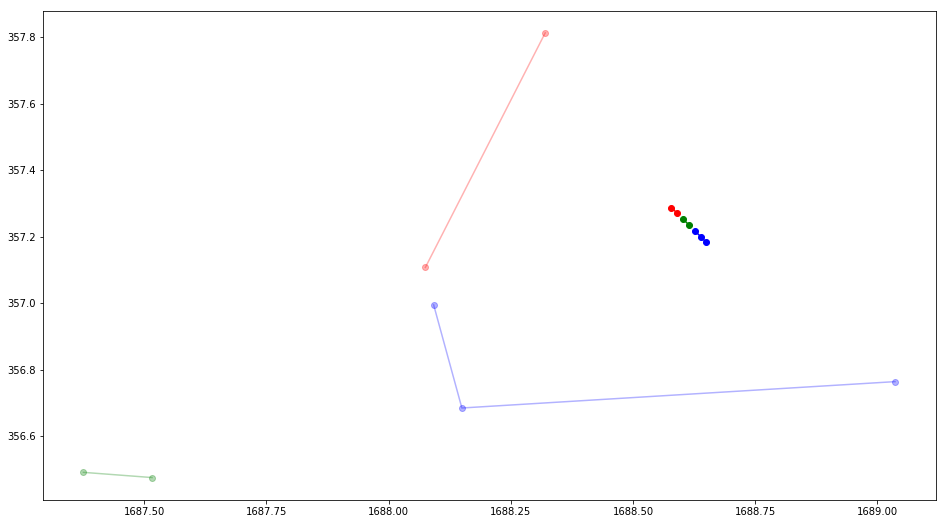

6


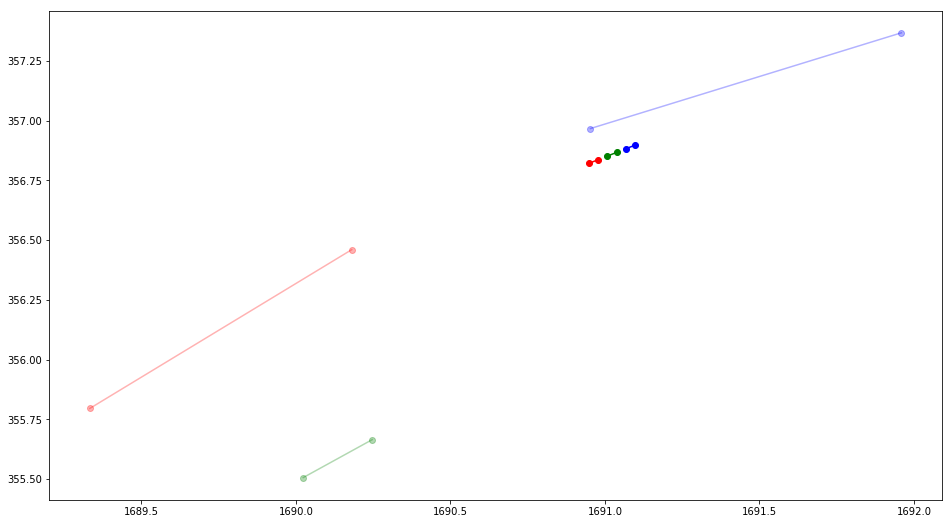

9


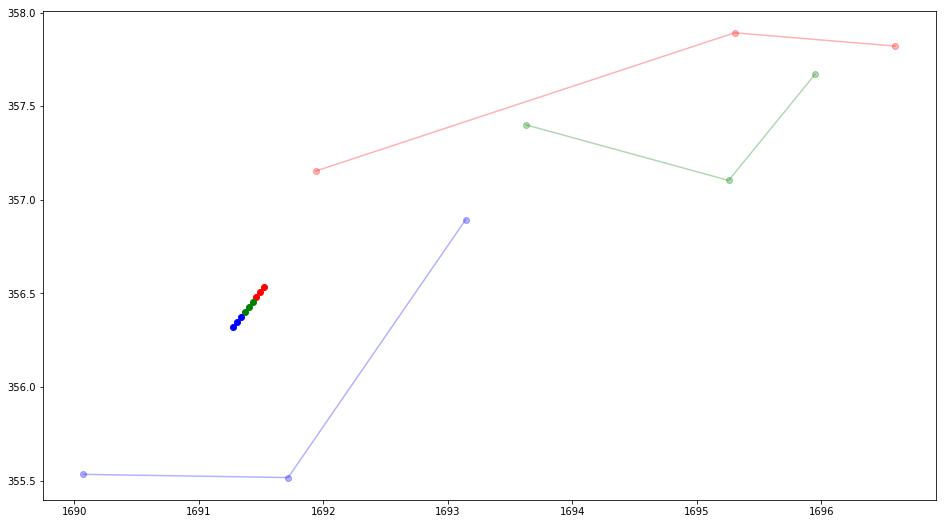

suppressed
47


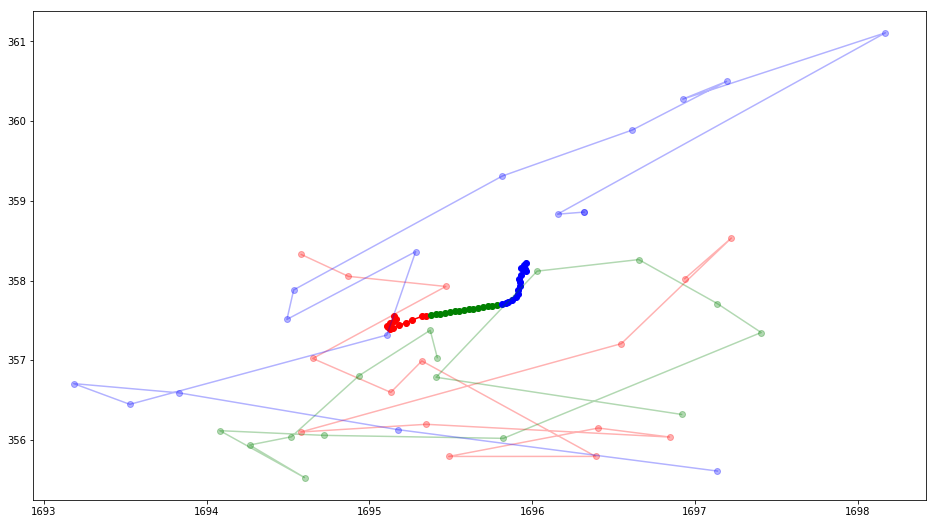

In [209]:
for chain in chain_list:
    pt_arr = np.array([box['pt'] for box in chain])
    pt_smoothed_arr = np.array([box['pt_smoothed'] for box in chain])
    if len(pt_arr) <2:
        print('suppressed')
        continue
    print(len(pt_arr))
    x,y = pt_arr[:,::2].mean(axis=1),pt_arr[:,1::2].mean(axis=1)
    x_bar,y_bar = pt_smoothed_arr[:,::2].mean(axis=1),pt_smoothed_arr[:,1::2].mean(axis=1)
    
    plt.figure(figsize=(16,9))
    plot_trace(x_bar, y_bar)
    plot_trace(x,y, alpha=0.3)
    plt.show()

In [210]:
#det_list = predict_cache_map['images1369.cache']

In [211]:
vis = cv2.imread('images/images1369.jpg')
vis = cv2.cvtColor(vis, cv2.COLOR_BGR2RGB)

In [212]:
pt = predict_cache_map['images1369.cache'][0]['pt']
pt_smoothed_next = predict_cache_map['images1369.cache'][0]['pt_smoothed_next']

pt_center = np.array([(pt[0]+pt[2])/2, (pt[1]+pt[3])/2])
pt_smoothed_next_center = np.array([(pt_smoothed_next[0]+pt_smoothed_next[2])/2, (pt_smoothed_next[1]+pt_smoothed_next[3])/2])

delta = pt_smoothed_next_center - pt_center
delta /= np.linalg.norm(delta) / 250

pt_smoothed_next_center_adjusted = pt_center + delta

cv2.rectangle(vis, (pt[0], pt[1]), (pt[2], pt[3]), (255, 0, 0), 3)
cv2.arrowedLine(vis, tuple(pt_center.astype(int)), tuple(pt_smoothed_next_center_adjusted.astype(int)), (0, 0, 255), 10)
#cv2.line(vis, tuple(pt_center.astype(int)), tuple(pt_smoothed_center_normed.astype(int)), (0, 0, 255), 10)
;

''

In [213]:
pt_center, pt_smoothed_center, delta, pt_smoothed_center_normed

(array([2233.61523438,  743.55932617]),
 array([2239.48583984,  742.89929199]),
 array([249.78145614,  10.45103674]),
 array([2482.04998536,  715.62772219]))

In [214]:
predict_cache_map['images1369.cache'][0]

{'score': tensor(0.9982),
 'label_name': 'boat',
 'pt': array([1854.5697 ,  440.91595, 2612.6606 , 1046.2028 ], dtype=float32),
 'matched': True,
 'pt_smoothed': array([1862.3739 ,  440.19183, 2620.9766 , 1045.0334 ], dtype=float32),
 'pt_smoothed_next': array([1862.6893 ,  440.35995, 2624.529  , 1047.595  ], dtype=float32),
 'pt_next': array([1848.9846,  434.87  , 2625.6733, 1044.3016], dtype=float32)}

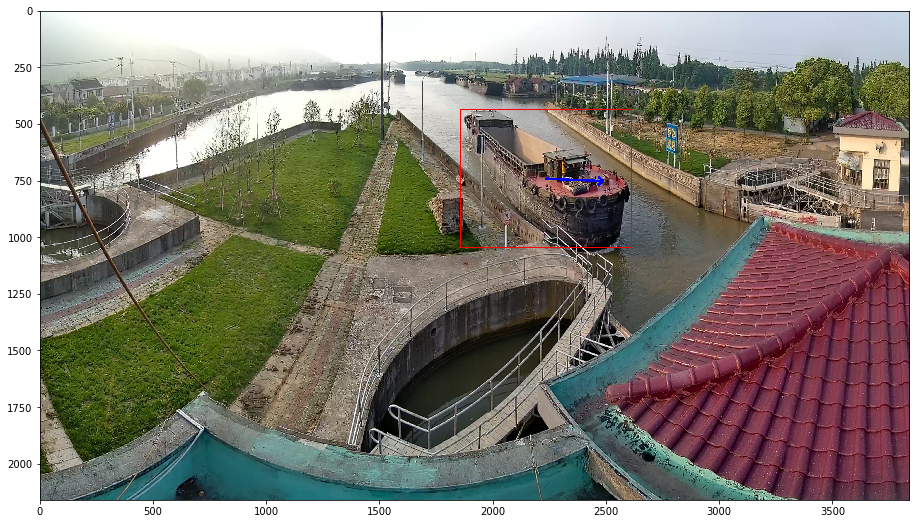

In [215]:
plt.figure(figsize=(16,9))
plt.imshow(vis)

In [314]:
def test_arrow(name = 'images1369', cvt=False, delta_smoothed = True):
    cache_name = '{}.cache'.format(name)
    img_path = 'images/{}.jpg'.format(name)
    
    vis = cv2.imread(img_path)
    if cvt:
        vis = cv2.cvtColor(vis, cv2.COLOR_BGR2RGB)
    
    #pt = predict_cache_map[cache_name][0]['pt']
    
    if len(predict_cache_map[cache_name]) == 0:
        return vis
    
    for i in range(len(predict_cache_map[cache_name])):
        pt = predict_cache_map[cache_name][i]['pt_smoothed']
        
        # draw rectangle
        cv2.rectangle(vis, (pt[0], pt[1]), (pt[2], pt[3]), (255, 0, 0), 3)
        
        # draw arrow
        pt_center = np.array([(pt[0]+pt[2])/2, (pt[1]+pt[3])/2])
        if delta_smoothed:
            if 'delta_smoothed' not in predict_cache_map[cache_name][i]:
                continue
            delta = predict_cache_map[cache_name][i]['delta_smoothed']
        else:
            if 'pt_smoothed_next' not in predict_cache_map[cache_name][i]:
                continue
            pt_smoothed_next = predict_cache_map[cache_name][i]['pt_smoothed_next']
            pt_smoothed_next_center = np.array([(pt_smoothed_next[0]+pt_smoothed_next[2])/2, (pt_smoothed_next[1]+pt_smoothed_next[3])/2])
            delta = pt_smoothed_next_center - pt_center
            
        delta /= np.linalg.norm(delta) / 200

        pt_smoothed_next_center_adjusted = pt_center + delta
        cv2.arrowedLine(vis, tuple(pt_center.astype(int)), tuple(pt_smoothed_next_center_adjusted.astype(int)), (0, 0, 255), 10)
    
    return vis

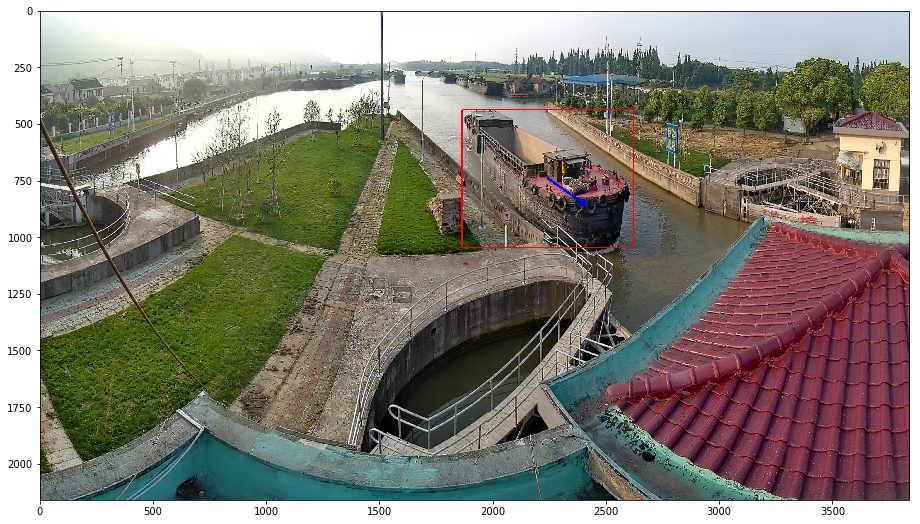

In [315]:
plt.figure(figsize=(16,9))
plt.imshow(test_arrow('images1369', cvt=True, delta_smoothed = False))

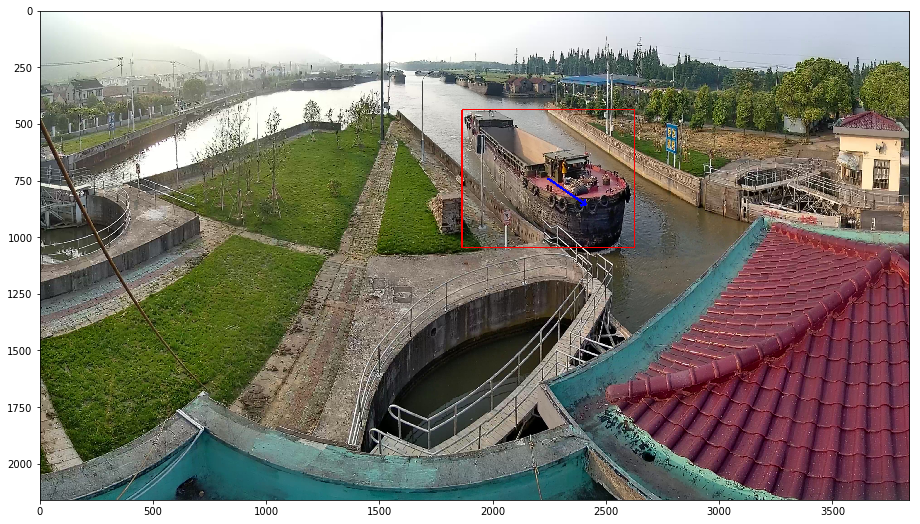

In [316]:
plt.figure(figsize=(16,9))
plt.imshow(test_arrow('images1370', cvt=True, delta_smoothed = False))

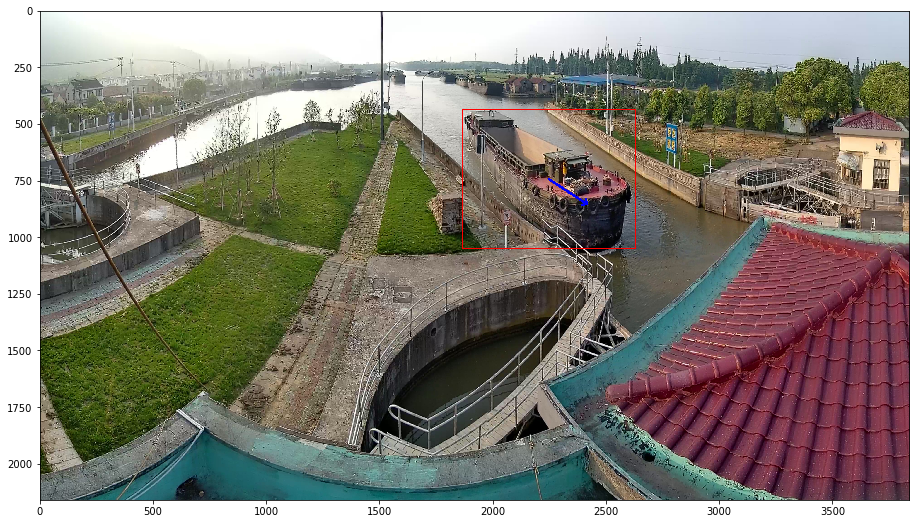

In [317]:
plt.figure(figsize=(16,9))
plt.imshow(test_arrow('images1371', cvt=True, delta_smoothed = False))

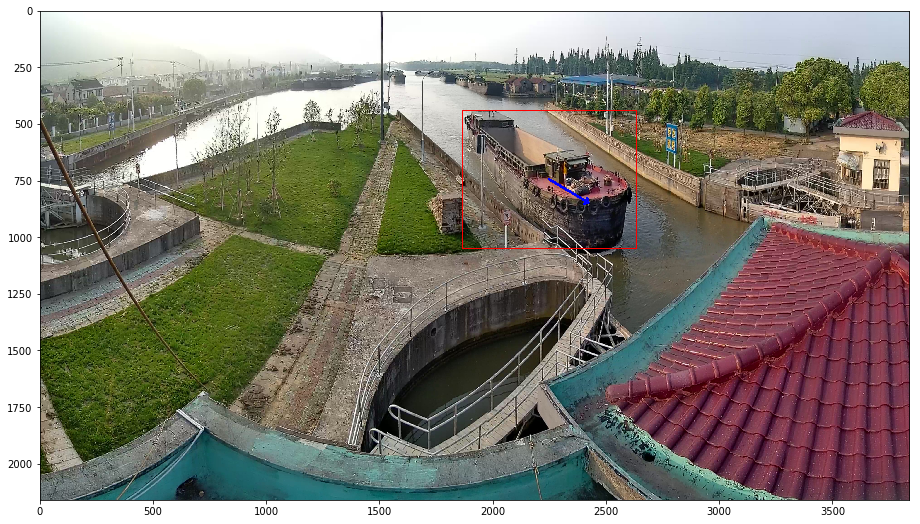

In [318]:
plt.figure(figsize=(16,9))
plt.imshow(test_arrow('images1372', cvt=True, delta_smoothed = False))

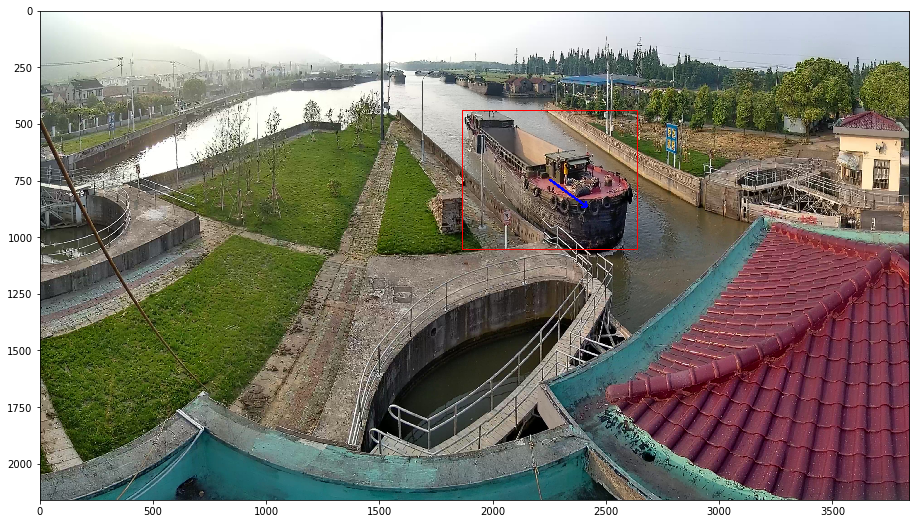

In [319]:
plt.figure(figsize=(16,9))
plt.imshow(test_arrow('images1373', cvt=True))

In [222]:
cv2.imwrite?

In [236]:
%%time

for i in range(1,3001):
    img = test_arrow('images{}'.format(i))
    cv2.imwrite('images_arrowed/images{}.jpg'.format(i), img)
    if i % 30 ==0:
        print('{}/3000'.format(i))

100/3000
200/3000
300/3000
400/3000
500/3000
600/3000
700/3000
800/3000
900/3000
1000/3000
1100/3000
1200/3000
1300/3000
1400/3000
1500/3000
1600/3000
1700/3000
1800/3000
1900/3000
2000/3000
2100/3000
2200/3000
2300/3000
2400/3000
2500/3000
2600/3000
2700/3000
2800/3000
2900/3000
3000/3000


In [229]:
%debug

> <ipython-input-226-f84e6541ad75>(15)test_arrow()
     13     for i in range(len(predict_cache_map[cache_name])):
     14         pt = predict_cache_map[cache_name][i]['pt_smoothed']
---> 15         pt_smoothed_next = predict_cache_map[cache_name][i]['pt_smoothed_next']
     16 
     17         pt_center = np.array([(pt[0]+pt[2])/2, (pt[1]+pt[3])/2])

ipdb> p pt_smoothed_next 
array([1862.6893 ,  440.35995, 2624.529  , 1047.595  ], dtype=float32)
ipdb> p predict_cache_map[cache_name][i]
{'score': tensor(0.6020), 'label_name': 'boat', 'pt': array([1622.3932 ,  311.0475 , 1745.9802 ,  399.83304], dtype=float32), 'matched': True, 'head': True, 'pt_smoothed': array([1622.3932 ,  311.0475 , 1745.9802 ,  399.83304], dtype=float32)}
ipdb> q


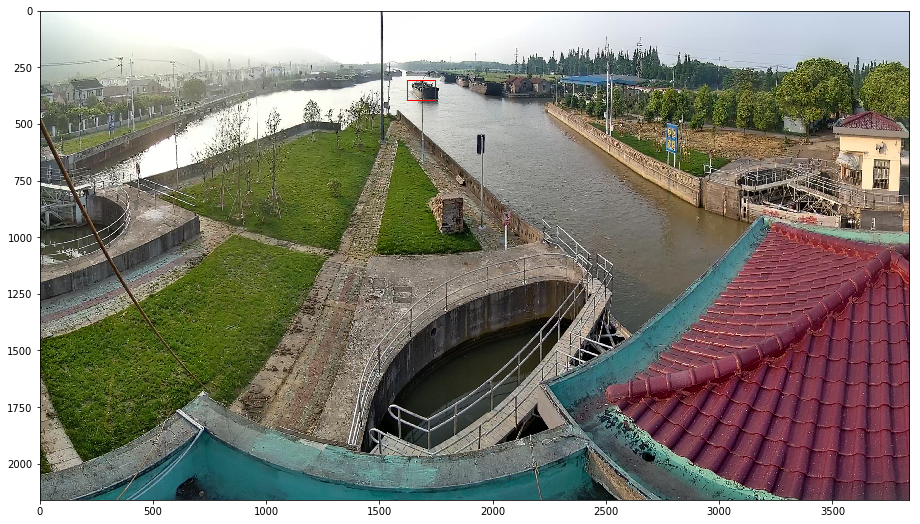

In [320]:
plt.figure(figsize=(16,9))
plt.imshow(test_arrow('images484', cvt=True))

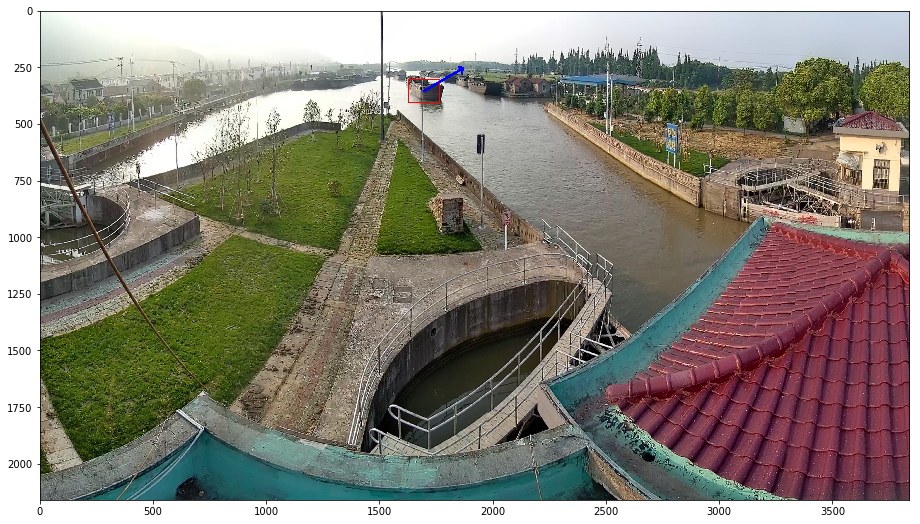

In [321]:
plt.figure(figsize=(16,9))
plt.imshow(test_arrow('images2959', cvt=True))

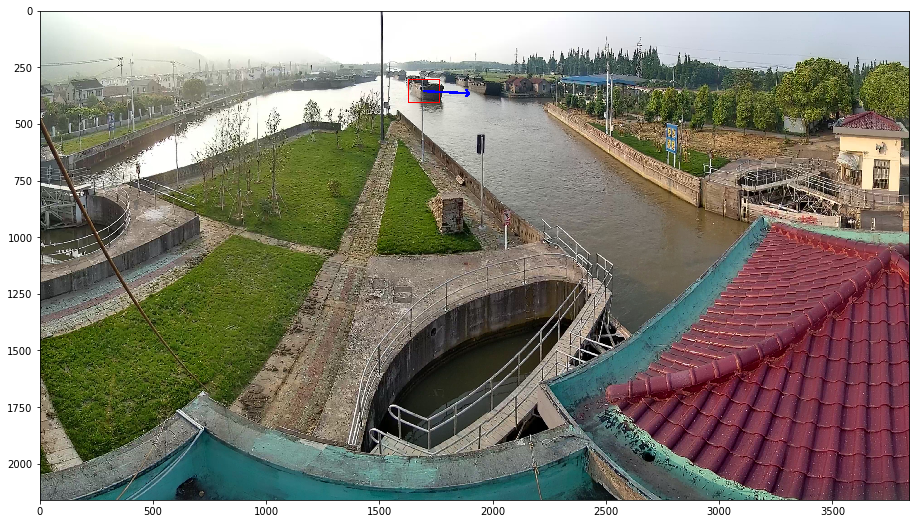

In [322]:
plt.figure(figsize=(16,9))
plt.imshow(test_arrow('images2959', cvt=True, delta_smoothed=False))

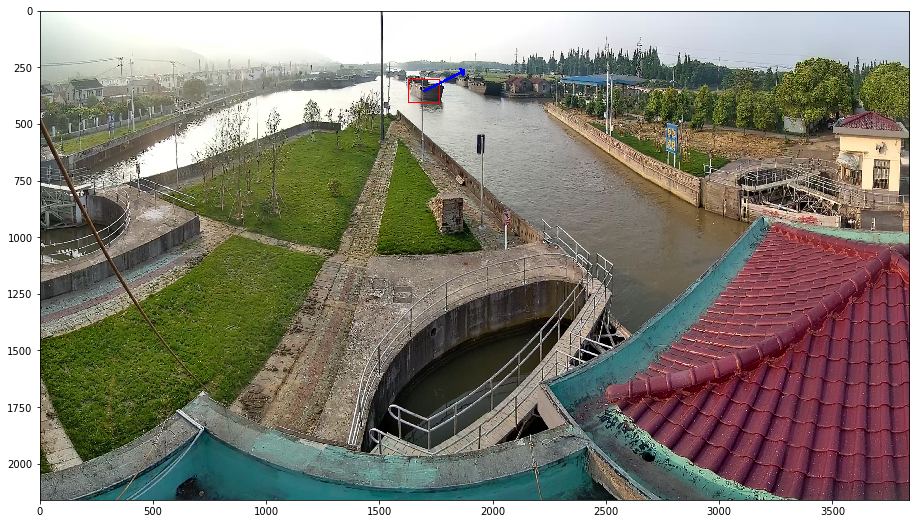

In [323]:
plt.figure(figsize=(16,9))
plt.imshow(test_arrow('images2960', cvt=True))

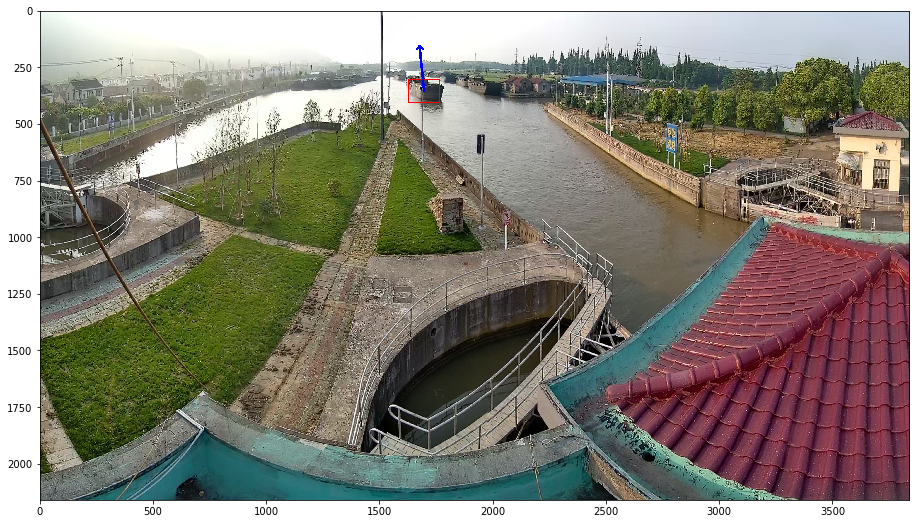

In [324]:
plt.figure(figsize=(16,9))
plt.imshow(test_arrow('images2960', cvt=True, delta_smoothed=False))

In [325]:
%%time

for i in range(1,3001):
    img = test_arrow('images{}'.format(i))
    cv2.imwrite('images_arrowed_delta_smoothed/images{}.jpg'.format(i), img)
    if i % 30 ==0:
        print('{}/3000'.format(i))

30/3000
60/3000
90/3000
120/3000
150/3000
180/3000
210/3000
240/3000
270/3000
300/3000
330/3000
360/3000
390/3000
420/3000
450/3000
480/3000
510/3000
540/3000
570/3000
600/3000
630/3000
660/3000
690/3000
720/3000
750/3000
780/3000
810/3000
840/3000
870/3000
900/3000
930/3000
960/3000
990/3000
1020/3000
1050/3000
1080/3000
1110/3000
1140/3000
1170/3000
1200/3000
1230/3000
1260/3000
1290/3000
1320/3000
1350/3000
1380/3000
1410/3000
1440/3000
1470/3000
1500/3000
1530/3000
1560/3000
1590/3000
1620/3000
1650/3000
1680/3000
1710/3000
1740/3000
1770/3000
1800/3000
1830/3000
1860/3000
1890/3000
1920/3000
1950/3000
1980/3000
2010/3000
2040/3000
2070/3000
2100/3000
2130/3000
2160/3000
2190/3000
2220/3000
2250/3000
2280/3000
2310/3000
2340/3000
2370/3000
2400/3000
2430/3000
2460/3000
2490/3000
2520/3000
2550/3000
2580/3000
2610/3000
2640/3000
2670/3000
2700/3000
2730/3000
2760/3000
2790/3000
2820/3000
2850/3000
2880/3000
2910/3000
2940/3000
2970/3000
3000/3000
Wall time: 12min 9s
